In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2

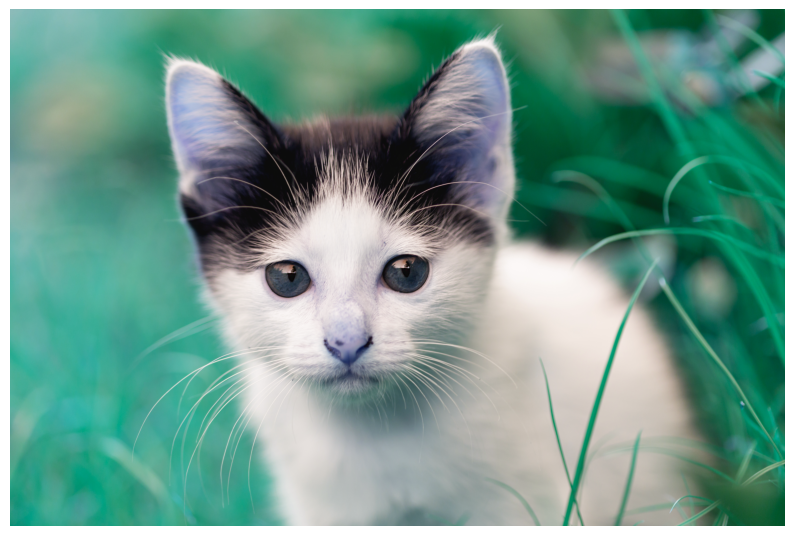

In [17]:
## input image and output image
plt.figure(figsize=(10,10))
img = cv2.imread('cat.jpg')
plt.imshow(img)
plt.axis('off')
plt.xlabel( 'x-axis')
plt.ylabel('y-axis')
plt.show()

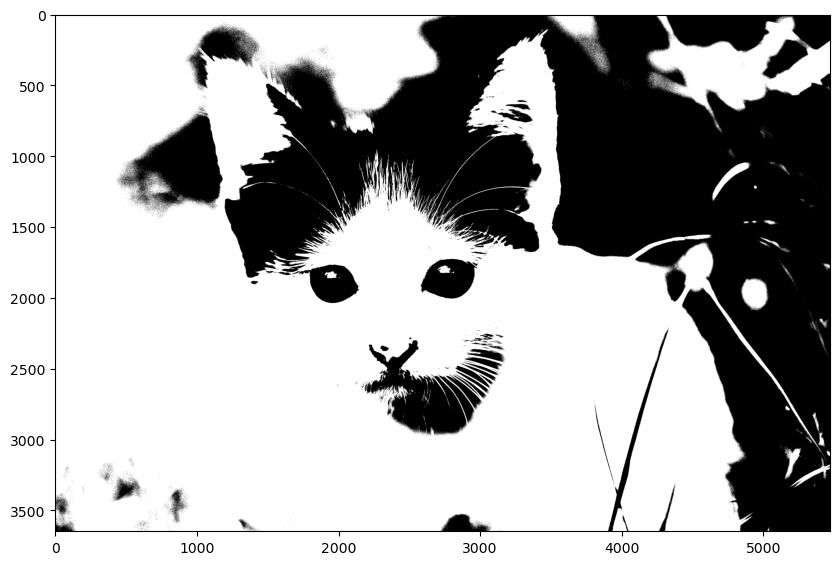

In [24]:
plt.figure(figsize=(10,10))
img=cv2.imread('cat.jpg')
gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
binary_img=cv2.threshold(gray_img,127,255,cv2.THRESH_BINARY)[1]
plt.imshow(binary_img,cmap='gray')

In [25]:
def bundary_sum(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    top_boundary=gray_img[0,:].sum()
    bottom_boundary=gray_img[-1,:].sum()
    left_boundary=gray_img[:,0].sum()
    right_boundary=gray_img[:,-1].sum()
    sum_boundary=top_boundary+bottom_boundary+left_boundary+right_boundary
    return sum_boundary

In [26]:
img=cv2.imread('cat.jpg')
sum=bundary_sum(img)
print(sum)

2424413


In [29]:
def diagonal_sum(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    diagonal_1=np.diag(gray_img).sum()
    diagonal_2=np.diag(np.fliplr(gray_img)).sum()
    sum=diagonal_1+diagonal_2
    if gray_img.shape[0]%2==1 and gray_img.shape[1]%2==1:
        center_pixel=gray_img[gray_img.shape[0]//2,gray_img.shape[1]//2]
        sum-=center_pixel
    return sum

In [30]:
img =cv2.imread('cat.jpg')
sum=diagonal_sum(img)
print(sum)

981712


In [31]:
def histogram(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    row,col=gray_img.shape
    hist=np.zeros(256)
    for i in range(row):
        for j in range(col):
            hist[gray_img[i,j]]+=1
    return hist

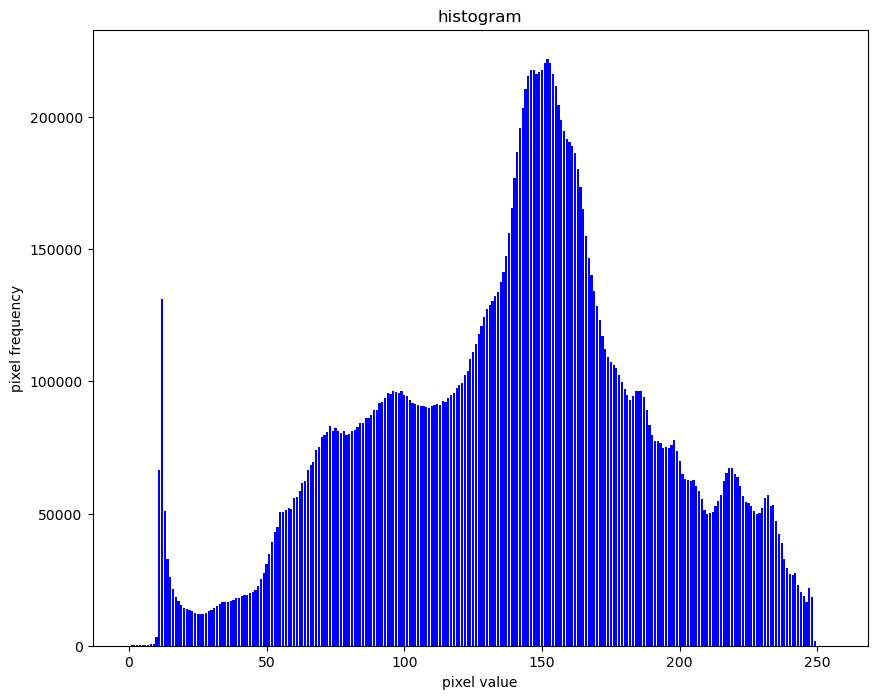

In [33]:
img=cv2.imread('cat.jpg')
plt.figure(figsize=(10,8))
plt.bar(range(256),histogram(img),color='blue')
plt.xlabel('pixel value')
plt.ylabel('pixel frequency')
plt.title('histogram')
plt.show()

In [11]:
def img_neg(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    return 255-gray_img

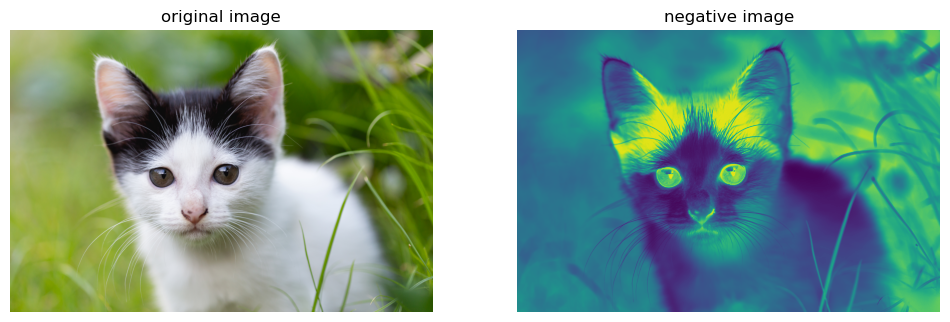

In [12]:
img=cv2.imread('cat.jpg')
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('original image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('negative image')
plt.axis('off')
plt.imshow(img_neg(img))
plt.show()

In [54]:
def log_transform(img,c=1):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray_img_float=gray_img.astype(np.float32)
    log_img=c*np.log(1+gray_img_float)
    log_img=cv2.normalize(log_img,None,0,255,cv2.NORM_MINMAX).astype(np.uint8)
    return log_img

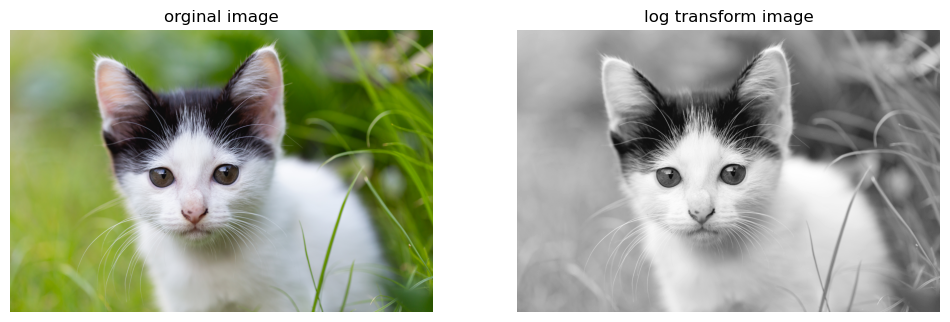

In [60]:
img=cv2.imread('cat.jpg')
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

plt.subplot(1,2,2)
plt.title('log transform image')
plt.axis('off')
plt.imshow(Log_transform(img),cmap='gray')
plt.show()

In [67]:
def power_transform(img,c=1,gamma=0.5):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray_img_float=gray_img.astype(np.float32)
    power_img=c*np.power(gray_img_float,gamma)
    power_img=cv2.normalize(power_img,None,0,255,cv2.NORM_MINMAX).astype(np.uint8)
    return power_img

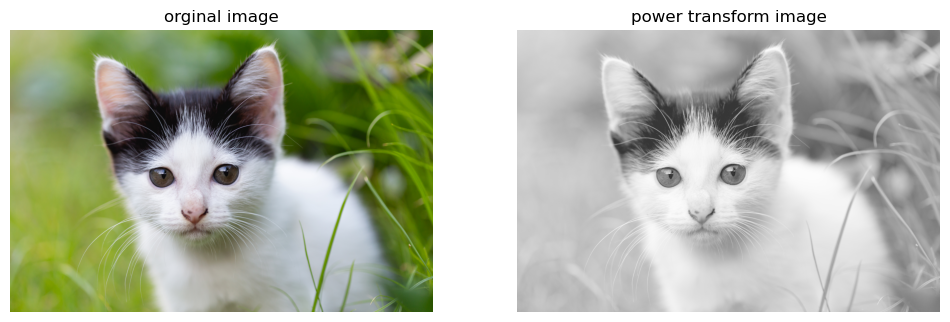

In [68]:
img=cv2.imread('cat.jpg')
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

plt.subplot(1,2,2)
plt.title('power transform image')
plt.axis('off')
plt.imshow(cv2.cvtColor(power_transform(img),cv2.COLOR_BGR2RGB))
plt.show()

In [75]:
## Split and merge

def split_image(img):
    img1=img[:img.shape[0]//2,:img.shape[1]//2]
    img2=img[:img.shape[0]//2,img.shape[1]//2:]
    img3=img[img.shape[0]//2:,:img.shape[1]//2]
    img4=img[img.shape[0]//2:,img.shape[1]//2:]
    return img1,img2,img3,img4

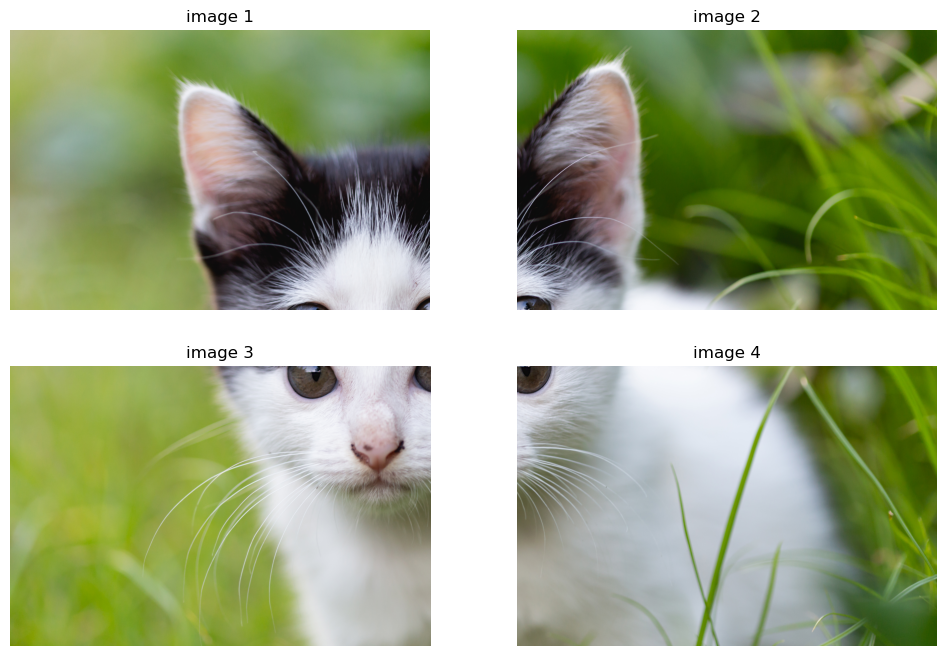

In [76]:
img=cv2.imread('cat.jpg')
img1,img2,img3,img4=split_image(img)
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
plt.title('image 1')
plt.axis('off')
plt.imshow(cv2.cvtColor(img1,cv2.COLOR_BGR2RGB))
plt.subplot(2,2,2)
plt.title('image 2')
plt.axis('off')
plt.imshow(cv2.cvtColor(img2,cv2.COLOR_BGR2RGB))
plt.subplot(2,2,3)
plt.title('image 3')
plt.axis('off')
plt.imshow(cv2.cvtColor(img3,cv2.COLOR_BGR2RGB))
plt.subplot(2,2,4)
plt.title('image 4')
plt.axis('off')
plt.imshow(cv2.cvtColor(img4,cv2.COLOR_BGR2RGB))
plt.show()


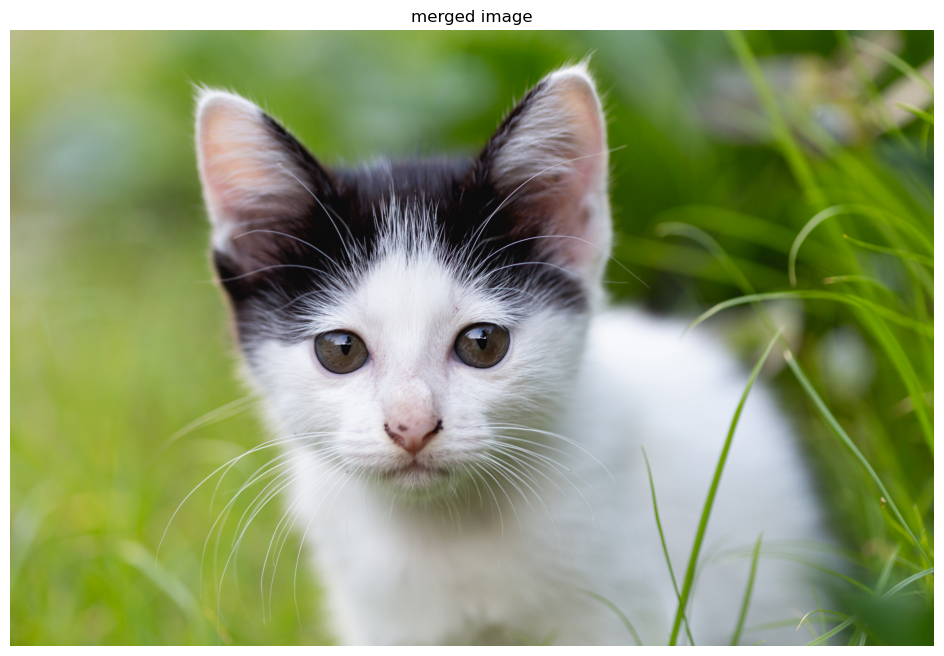

In [97]:
merged__img1=np.concatenate((img1,img2),axis=1)
merged__img2=np.concatenate((img3,img4),axis=1)
merged_img=np.concatenate((merged__img1,merged__img2),axis=0)
plt.figure(figsize=(12,8))
plt.title('merged image')
plt.axis('off')
plt.imshow(cv2.cvtColor(merged_img,cv2.COLOR_BGR2RGB))
plt.show()

In [134]:
def pad(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    row,col=gray_img.shape
    padding_img=np.zeros((row+80,col+80))
    padding_img[40:row+40,40:col+40]=gray_img
    return padding_img

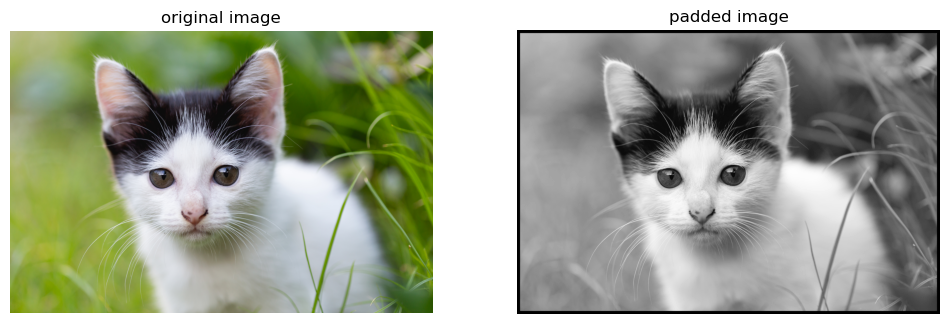

In [135]:
img=cv2.imread('cat.jpg')  
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.title('original image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.title('padded image')
plt.axis('off')
padding_img = pad(img)
plt.imshow(padding_img,cmap='gray')
plt.show()

In [170]:
def blurred_img(img):
    image=cv2.GaussianBlur(img,(3,3),0)
    return image

<function matplotlib.pyplot.show(close=None, block=None)>

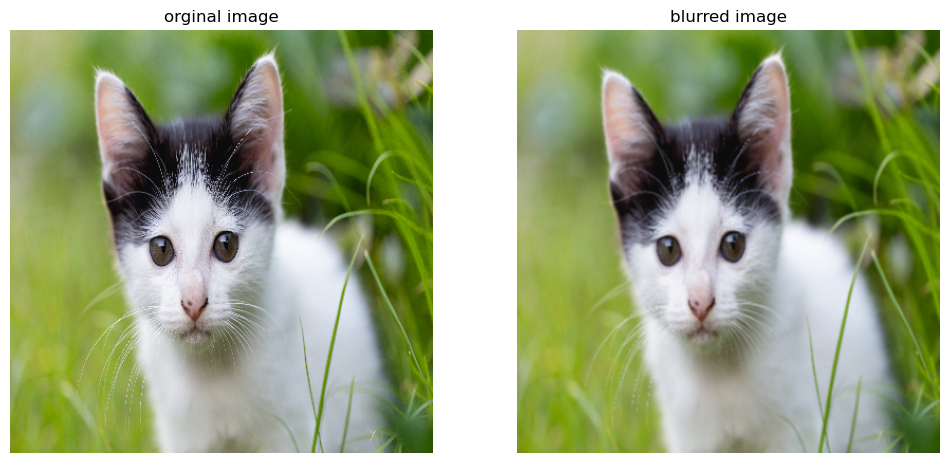

In [171]:
img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
blurring_img=blurred_img(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('blurred image')
plt.axis('off')
plt.imshow(cv2.cvtColor(blurring_img,cv2.COLOR_BGR2RGB))
plt.show

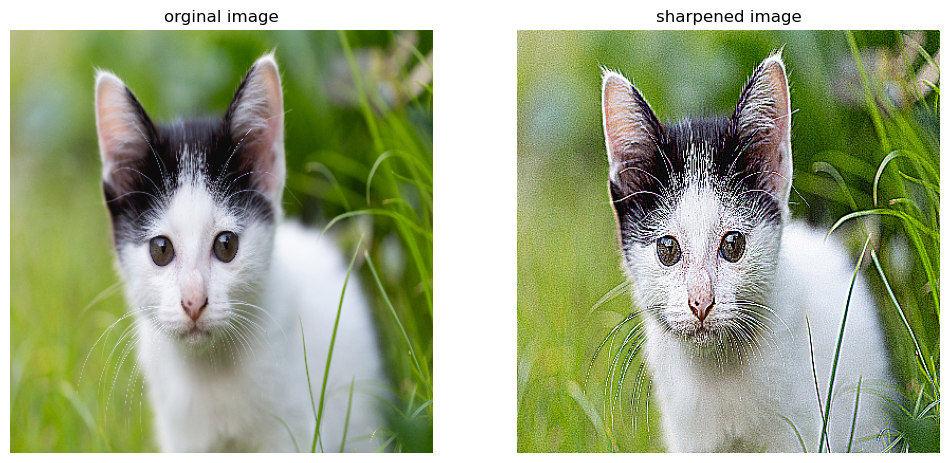

In [166]:
## Image sharpening
def sharpen_image(img):
    kernel=np.array([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]])
    sharpened_img=cv2.filter2D(img,-1,kernel)
    return sharpened_img

img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
sharpened_img=sharpen_image(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('sharpened image')
plt.axis('off')
plt.imshow(cv2.cvtColor(sharpened_img,cv2.COLOR_BGR2RGB))
plt.show()

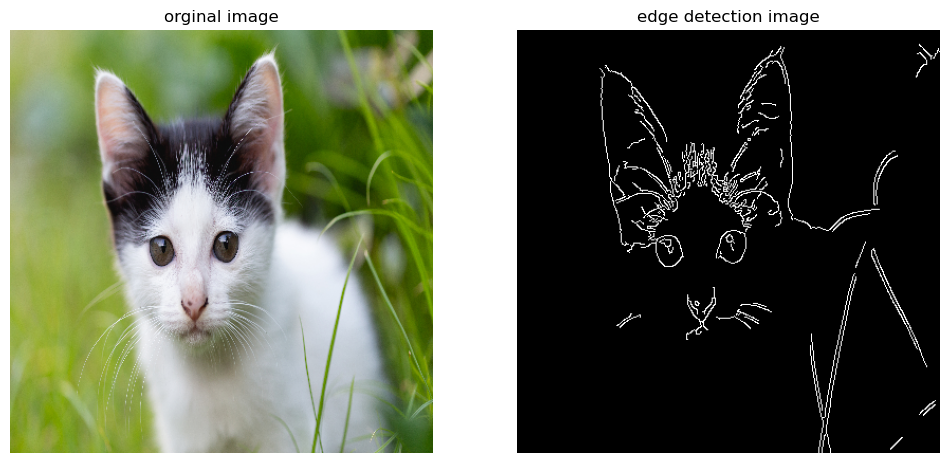

In [174]:
##edge detection
def edge_detection(img):
    gray_image=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gaussain_blur=cv2.GaussianBlur(gray_image,(3,3),0)
    edge=cv2.Canny(gaussain_blur,100,200)
    return edge


img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
edge=edge_detection(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('edge detection image')
plt.axis('off')
plt.imshow(edge,cmap='gray')
plt.show()

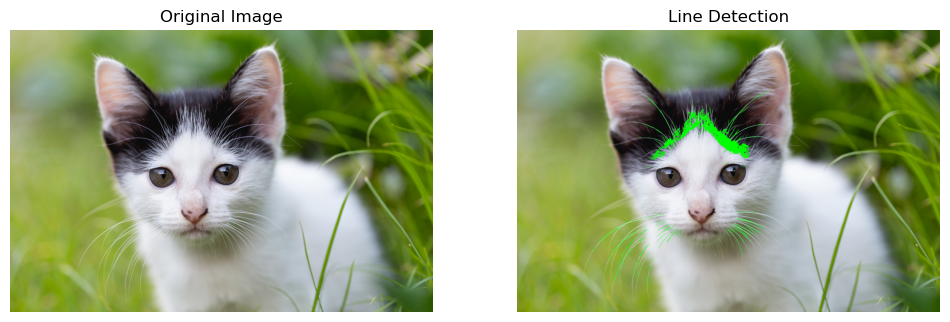

In [177]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def edge_detection(img):
    # Convert the image to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur to reduce noise
    blurred_img = cv2.GaussianBlur(gray_img, (5, 5), 0)
    
    # Apply Canny edge detector
    edges = cv2.Canny(blurred_img, 50, 150)
    
    return edges

def line_detection(img):
    # Detect edges in the image
    edges = edge_detection(img)
    
    # Apply Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=100, minLineLength=50, maxLineGap=10)
    
    # Create a copy of the original image to draw lines on
    line_img = np.copy(img)
    
    # Draw the detected lines on the image
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    return line_img

# Load the image
img = cv2.imread('cat.jpg')

# Apply line detection
line_img = line_detection(img)

# Display the original and line-detected images
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 2, 2)
plt.title('Line Detection')
plt.axis('off')
plt.imshow(cv2.cvtColor(line_img, cv2.COLOR_BGR2RGB))

plt.show()

In [178]:
## Point detection
def point_detection(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    laplacian = cv2.Laplacian(gray_img, cv2.CV_64F)
    return laplacian

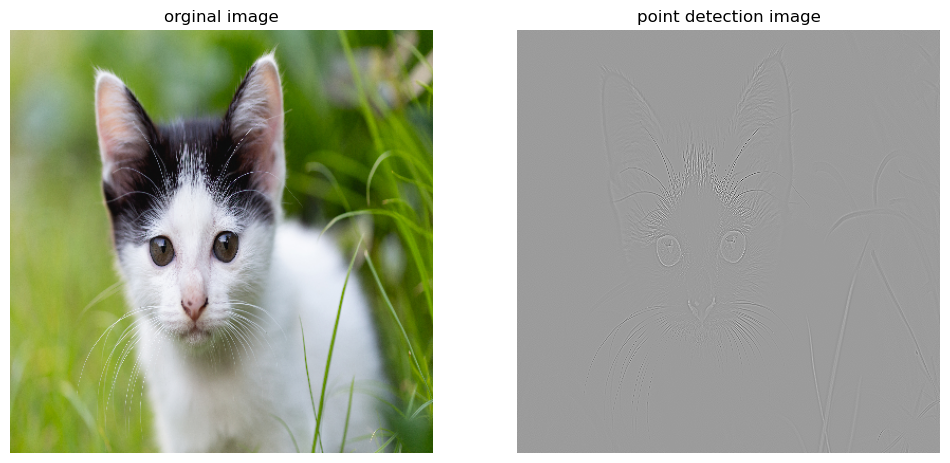

In [179]:
img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
point=point_detection(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('point detection image')
plt.axis('off')
plt.imshow(point,cmap='gray')
plt.show()

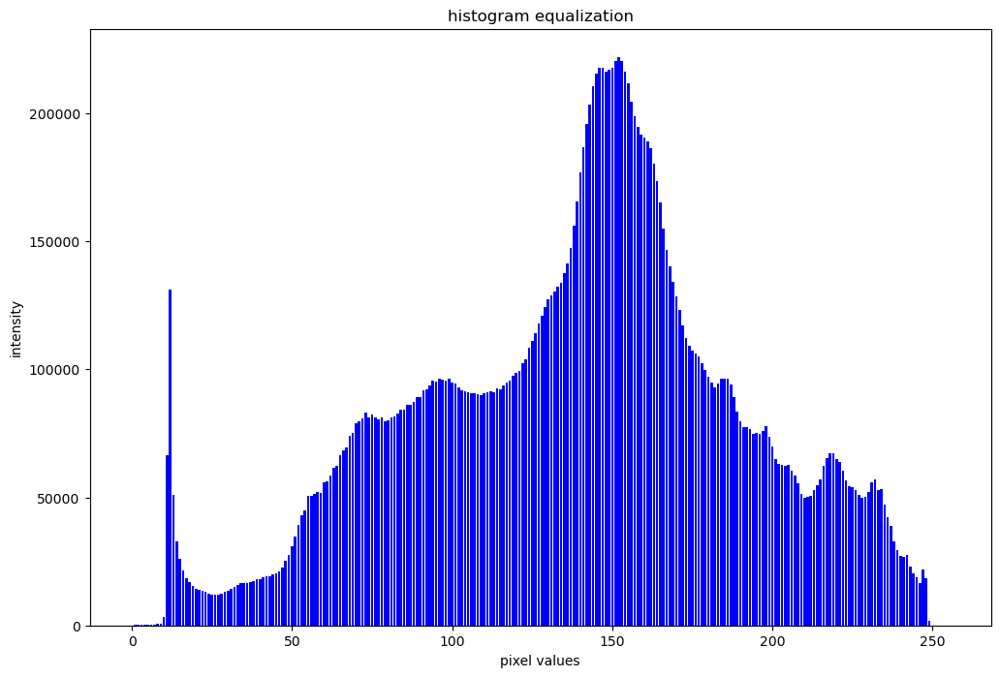

In [185]:
## histogram equalization
def hist_eqn (img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    row,col=gray_img.shape
    hist=np.zeros(256)
    for i in range(row):
        for j in range (col):
            hist[gray_img[i,j]]+=1
    
    cdf=np.zeros(256)
    cdf[0]=hist[0]
    for i in range(1,256):
        cdf[i]=cdf[i-1]+hist[i]
    cdf=cdf/cdf[-1]
    cdf=cdf*255
    cdf=cdf.astype(np.uint8)
    eqn_img=cdf[gray_img]
    return eqn_img, hist

img=cv2.imread('cat.jpg')
eqn_img, hist = hist_eqn(img)
plt.figure(figsize=(12,8))
plt.bar(range(256),hist,color='blue')
plt.title('histogram equalization')
plt.xlabel('pixel values')
plt.ylabel('intensity')
plt.show()

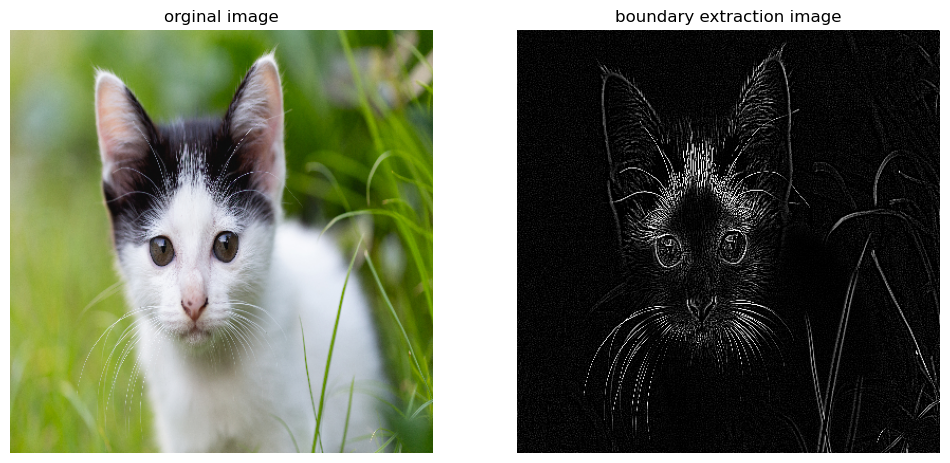

In [186]:
## boundary extraction
def boundary_extraction(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kernel=np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
    boundary=cv2.filter2D(gray_img,-1,kernel)
    return boundary

img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
boundary=boundary_extraction(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('boundary extraction image')
plt.axis('off')
plt.imshow(boundary,cmap='gray')
plt.show()


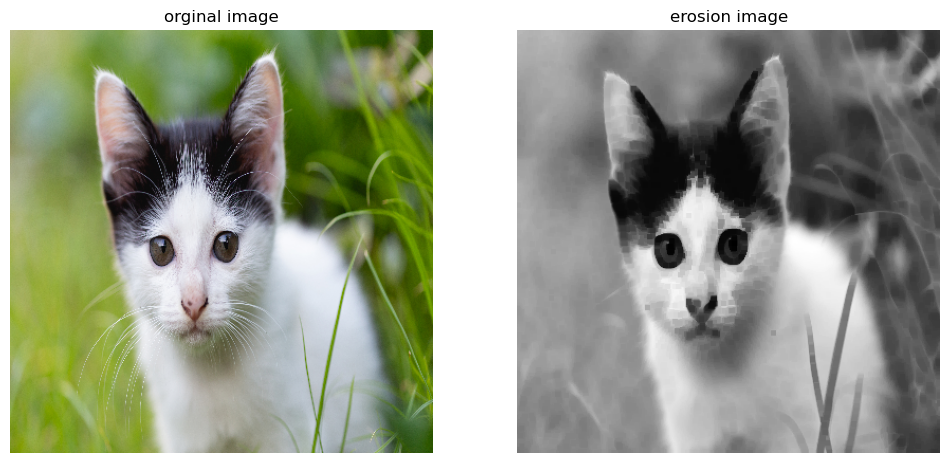

In [187]:
## erosion
def erosion(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kernel=np.ones((5,5),np.uint8)
    erosion=cv2.erode(gray_img,kernel,iterations=1)
    return erosion

img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
erosion=erosion(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('erosion image')
plt.axis('off')
plt.imshow(erosion,cmap='gray')
plt.show()


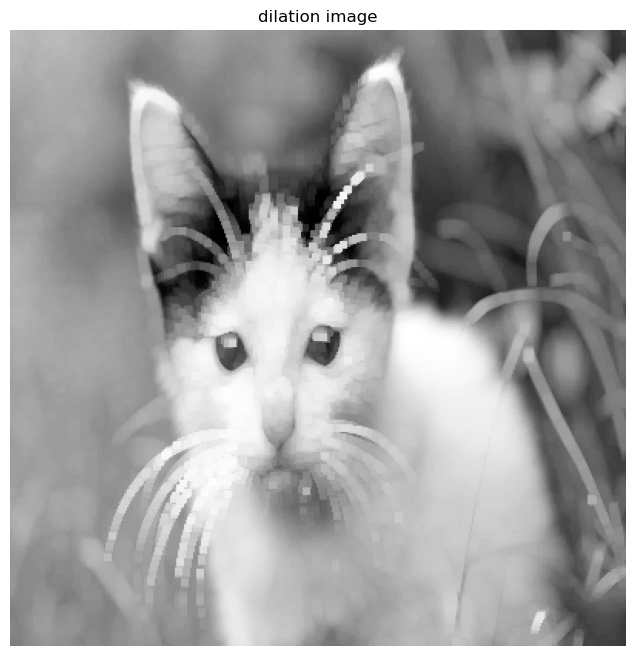

In [194]:
##dilaton image
def dilaton(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kernel=np.ones((5,5),np.uint8)
    dilation_img=cv2.dilate(gray_img,kernel)
    return dilation_img

img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
plt.figure(figsize=(12,8))
dilation_image=dilaton(img)
plt.imshow(dilation_image,cmap='gray')
plt.title('dilation image')
plt.axis('off')
plt.show()

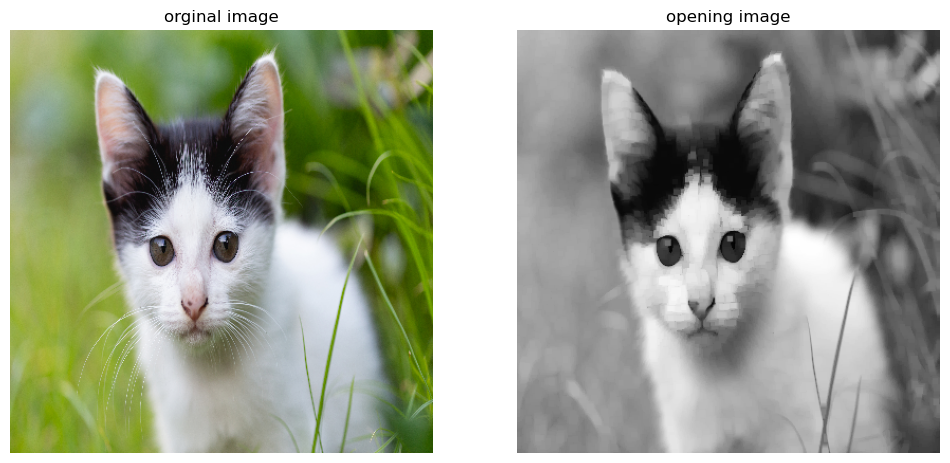

In [195]:
## opening
def opening(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kernel=np.ones((5,5),np.uint8)
    opening_img=cv2.morphologyEx(gray_img,cv2.MORPH_OPEN,kernel)
    return opening_img

img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
opening_img=opening(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('opening image')
plt.axis('off')
plt.imshow(opening_img,cmap='gray')
plt.show()


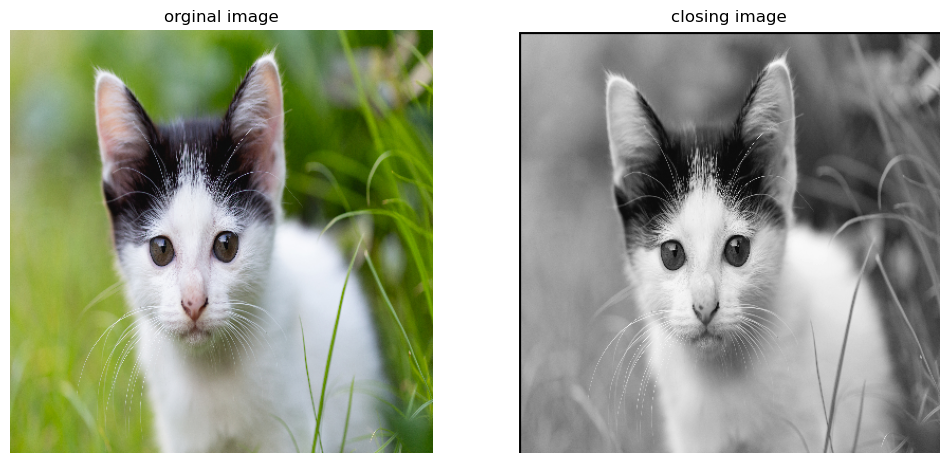

In [196]:
## closing

def closing(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kernel=np.zeros((5,5),np.uint8)
    closing_img=cv2.morphologyEx(gray_img,cv2.MORPH_CLOSE,kernel)
    return closing_img



img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
closing_image=closing(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('closing image')
plt.axis('off')
plt.imshow(closing_image,cmap='gray')
plt.show()


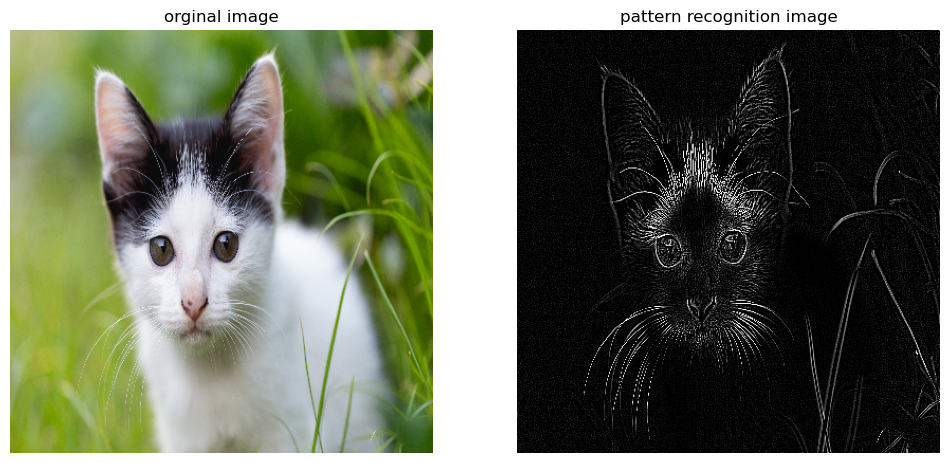

In [197]:
## pattern recognition
def pattern_recognition(img):
    gray_img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kernel=np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
    pattern=cv2.filter2D(gray_img,-1,kernel)
    return pattern

img=cv2.imread('cat.jpg')
img=cv2.resize(img,(400,400))
pattern=pattern_recognition(img)
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title('orginal image')
plt.axis('off')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.title('pattern recognition image')
plt.axis('off')
plt.imshow(pattern,cmap='gray')
plt.show()
